# Visualización interactiva de datos geográficos

````{admonition} Objetivos
- Utilizar ***mapas coropléticos*** para ***representar datos en distintas regiones geográficas***
- Generar mapas coropléticos interactivos, incluyendo mapas que representan países en el mundo y mapas que representan estados en EE. UU., haciendo cambios de diseño para añadir ***funcionalidad/estética, y animaciones***
- Generar ***gráficos de dispersión interactivos*** en los mapas, incluidos los gráficos de dispersión que indican las geolocalizaciones de lugares de interés y gráficos de burbujas interactivos en mapas
- Generar ***gráficos lineales interactivos*** en mapas, incluyendo aquellos que indiquen trayectorias en un mapa
````

## Introducción

- La mayoría de los conjuntos de datos generados en el mundo actual incluyen algunas ***características que representan aspectos espaciales o aspectos geográficos***. Por ejemplo, los usuarios de las plataformas de medios sociales se caracterizan por las diferentes partes del mundo en las que residen, las métricas de desarrollo mundial se calculan para diferentes países del mundo, las rutas de transporte que abarcan diferentes lugares del planeta, etc. Es esencial aprender formas sistemáticas de entender y presentar esa información de forma digerible y a la vez perspicaz. 
- Esta sección le ayudará a desarrollar esta capacidad proporcionando las herramientas necesarias para generar una variedad de gráficos que representen datos geográficos. Mientras que `altair` y `geopandas` ofrecen interesantes posibilidades para visualizar datos geográficos, datos geográficos, `plotly` es especialmente bueno para generar una variedad de gráficos geográficos que son fáciles de construir, depurar y personalizar. Por lo tanto, en este capítulo, utilizaremos `plotly` para demostrar la generación de diferentes clases de gráficos geográficos con múltiples conjuntos de datos disponibles públicamente de una variedad de contextos.

## Mapas coropléticos

- Un mapa coroplético es un ***mapa de una región con diferentes divisiones coloreadas para indicar el valor de una característica específica en esa división***. Esta división puede ser un país, un estado, un distrito o cualquier otra zona bien documentada. Por ejemplo, se puede visualizar la población de un país en un mapa mundial, la población de un estado en un mapa de un país o el porcentaje de población con acceso a una tecnología con un mapa coroplético.

## Creación de un mapa coroplético

- En la primera visualización de esta sección, vamos a utilizar las estadísticas de uso de internet publicadas en [Our World in Data](https://ourworldindata.org/internet) y presentar el ***porcentaje de la población que utiliza internet en cada país desde 1990 hasta 2017***.

- ¿Se ha fijado en la característica llamada Código en el conjunto de datos? Se trata de un código asignado a cada país por una norma llamada ISO 3166-1. Se utiliza ampliamente para que los desarrolladores de todo el mundo tengan una forma común de referirse y acceder a los nombres de los países en cualquier dato.

- Como el `DataFrame` contiene registros de varios años, primero vamos a subdividir los datos en un año específico, por ejemplo, 2016. A continuación, utilizaremos este subconjunto para generar un mapa mundial. Para ello, vamos a seguir los siguientes pasos

- Para la presente sección es recomendable utilizar el editor `Jupyter Lab`. De esta forma evitará conflictos al generar un libro de `Jupyter Boook` con las visualizaciones geográficas (ver [ipywidgets JBook](https://lihkir.github.io/DataVizPythonRUninorte/interactive_dataviz.html#ipywidgets-jbook). Para su instalación y para agregar en este el entorno virtual, por ejemplo, `ml_tf` procedemos de la siguiente manera:

````python
pip install ipykernel
````

````python
python -m ipykernel install --user --name=ml_tf
````

- Importar los módulos de Python

In [1]:
import pandas as pd

-  Lea los datos del archivo `.csv`

In [2]:
internet_usage_url = "https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/share-of-individuals-using-the-internet.csv"
internet_usage_df = pd.read_csv(internet_usage_url)

- Hacer subconjuntos de datos de un año específico, ya que el `DataFrame` contiene registros de múltiples años

In [3]:
internet_usage_2016 = internet_usage_df.query("Year==2016")
internet_usage_2016.head()

,Country,Code,Year,Individuals using the Internet (% of population)
16,Afghanistan,AFG,2016,10.595726
39,Albania,ALB,2016,66.363445
63,Algeria,DZA,2016,42.945527
85,Andorra,AND,2016,97.930637
107,Angola,AGO,2016,13.000000


- Para los siguientes pasos, vamos a utilizar el módulo express (por su simplicidad) de `plotly` y utilizar la función `choropleth` del módulo. El primer argumento que se pasa a esta función es el DataFrame que queremos visualizar. Los siguientes parámetros:
    - `locations`: Se establece como el nombre de la columna del DataFrame que contiene los códigos de país ISO 3166
    - `color`: Se establece el nombre de la columna que contiene la característica numérica con la que se va a colorear el mapa
    - `hover_name`: Se establece el nombre de la columna que contiene la característica que se mostrará al pasar el ratón por encima del mapa
    - `color_continuous_scale`: Esto se establece en un esquema de color, como: Blues | Reds | Greens | px.colors.sequential.Plasma.
- Genera un mapa coroplético mundial interactivo utilizando la función choropleth de la biblioteca `plotly`
- Para visualizarlo de forma dinámica en su `Jupyter Notebook` utlice solamente `fig.show()`

In [4]:
import plotly.express as px
from IPython.display import IFrame, display, HTML
import chart_studio.plotly as py

In [5]:
config={'showLink': False, 'displayModeBar': False}

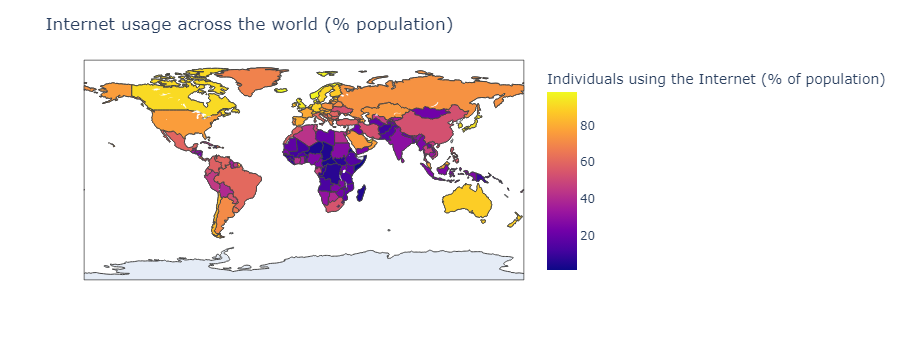

In [6]:
fig = px.choropleth(internet_usage_2016, 
                    locations="Code", # column containing ISO 3166 country codes
                    color = "Individuals using the Internet (% of population)", # column by which to color-code
                    hover_name = "Country", # column to display in hover information
                    color_continuous_scale = px.colors.sequential.Plasma)
fig.update_layout(title_text = 'Internet usage across the world (% population)')
fig.show()

- Observemos el gráfico con atención y veamos si las observaciones coinciden con nuestros conocimientos generales. Como era de esperar, el uso de internet en el mundo occidental es mayor que en el este.
- Es interesante ver en la Figura que un mayor porcentaje de la población ($\approx91,6$) en Australia y Canadá tiene acceso a Internet en comparación con Estados Unidos y la mayoría de los países europeos ($\approx$59,5).

## Ajustar un mapa coroplético mundial

- En este ejercicio, haremos algunos cambios sencillos en el diseño del mapa coroplético, como cambiar la proyección del mapa de *flat* a *natural earth*, hacer zoom en una región específica, añadir texto al mapa utilizando la función `update_layout`, y añadir una función de rotación. 

- Importar los módulos de `Python`

In [7]:
import pandas as pd

-  Lea los datos del archivo `.csv`

In [8]:
internet_usage_url = "https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/share-of-individuals-using-the-internet.csv"
internet_usage_df = pd.read_csv(internet_usage_url)

- Hacer subconjuntos de datos de un año específico, ya que el `DataFrame` contiene registros de múltiples años

In [9]:
internet_usage_2016 = internet_usage_df.query("Year==2016")
internet_usage_2016.head()

,Country,Code,Year,Individuals using the Internet (% of population)
16,Afghanistan,AFG,2016,10.595726
39,Albania,ALB,2016,66.363445
63,Algeria,DZA,2016,42.945527
85,Andorra,AND,2016,97.930637
107,Angola,AGO,2016,13.000000


- Digamos que ***solo nos interesa ver el uso de internet en el continente de Sur América***. Establezca `geo_scope` a *south america* (ver [layout-geo-scope](https://plotly.com/python/reference/#layout-geo-scope)) en la función `update_layout` para hacer zoom en la región de Asia. Podemos hacerlo rápidamente con el siguiente código

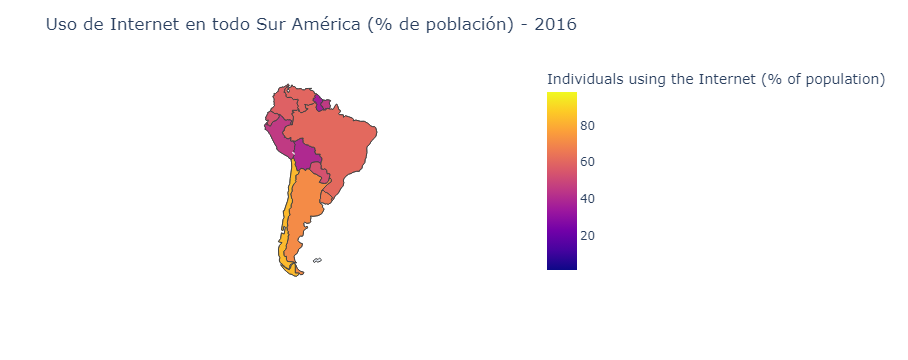

In [10]:
import plotly.express as px

fig = px.choropleth(internet_usage_2016,
                    locations="Code",
                    color="Individuals using the Internet (% of population)", # column by which to color-code
                    hover_name="Country", # column to display in hover information 
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.update_layout(
    # add a title text for the plot
    title_text = 'Uso de Internet en todo Sur América (% de población) - 2016',
    geo_scope = 'south america' # can be set to north america | south america | africa | asia | europe | usa
)
fig.show()

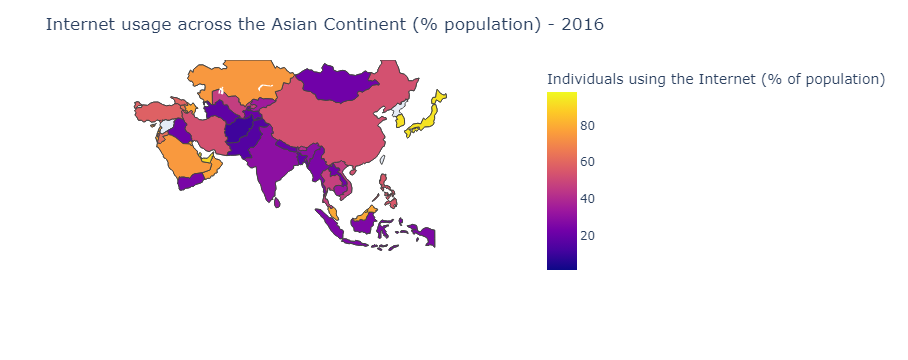

In [11]:
import plotly.express as px

fig = px.choropleth(internet_usage_2016,
                    locations="Code",
                    color="Individuals using the Internet (% of population)", # column by which to color-code
                    hover_name="Country", # column to display in hover information 
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.update_layout(
    # add a title text for the plot
    title_text = 'Internet usage across the Asian Continent (% population) - 2016',
    geo_scope = 'asia' # can be set to north america | south america | africa | asia | europe | usa
)
fig.show()

- Establece *projection type* como *natural earth* (ver [layout-geo-projection-type](https://plotly.com/python/reference/layout/geo/#layout-geo-projection-type)). La gráfica podría rotarse como un globo terráqueo real

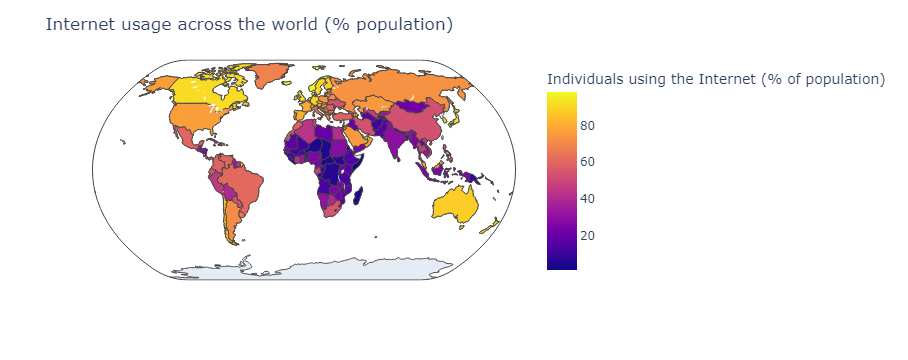

In [12]:
import plotly.express as px

fig = px.choropleth(internet_usage_2016,
                    locations="Code",
                    color="Individuals using the Internet (% of population)", # column by which to color-code
                    hover_name="Country", # column to display in hover information
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.update_layout(
    # add a title text for the plot
    title_text = 'Internet usage across the world (% population)',
    # set projection style for the plot
    geo = dict(projection={'type':'natural earth'}) # by default, projection type is set to 'equirectangular'
)
fig.show()

- Prueba a arrastrar el mapa ahora. La rotación le da al gráfico un toque mucho más realista. `plotly` ofrece muchas opciones de este tipo para ajustar las visualizaciones. Para experimentar con otros estilos de proyección aparte de los que hemos visto en nuestros ejemplos, visite la documentación oficial de documentación de `plotly` (ver [Plotly reference](https://plotly.com/python/reference/)).

## Añadir animación a un mapa coroplético

- En este ejercicio, animaremos un mapa coroplético mundial. Primero, elegiremos una columna. A continuación, añadiremos un componente deslizante al mapa para ver los registros en diferentes puntos temporales

- Importar los módulos de Python

In [13]:
import pandas as pd

-  Lea los datos del archivo `.csv`

In [14]:
internet_usage_url = "https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/share-of-individuals-using-the-internet.csv"
internet_usage_df = pd.read_csv(internet_usage_url)

- Añade una animación a la columna *year* utilizando `animation_frame=year`

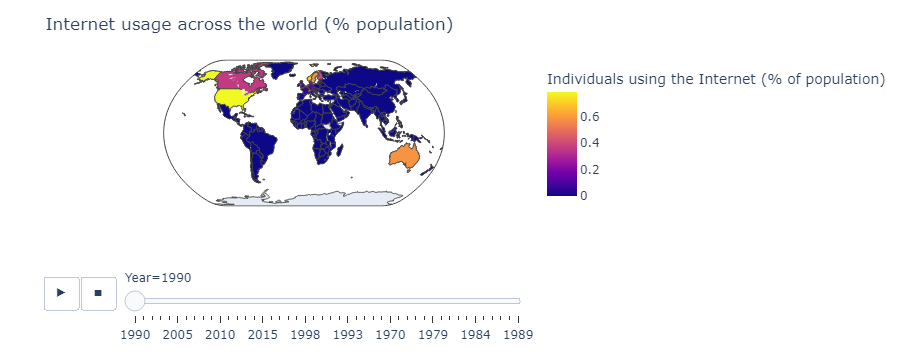

In [15]:
import plotly.express as px

fig = px.choropleth(internet_usage_df, 
                    locations="Code",
                    color="Individuals using the Internet (% of population)", # lifeExp is a column of gapminder
                    hover_name="Country", # column to add to hover information
                    animation_frame="Year", # column on which to animate
                    color_continuous_scale=px.colors.sequential.Plasma)
 
fig.update_layout(
    # add a title text for the plot
    title_text = 'Internet usage across the world (% population)',
    # set projection style for the plot
    geo = dict(projection={'type':'natural earth'}) # by default, projection type is set to 'equirectangular'
)
fig.show()

- Observe que el primer argumento de nuestra función de coropleta es el `DataFrame` `internet_usage_df` `DataFrame`, que contiene registros para todos los años entre 1970- 2017, y no `internet_usage_2016`, que habíamos utilizado hasta ahora.

- Si utilizáramos el `DataFrame` `internet_usage_2016`, obtendríamos un gráfico estático sin deslizante, ya que no habría nada que animar con registros de un solo año. La funcionalidad de la animación y el deslizador es una forma sencilla de ver cómo ha crecido el uso de internet en diferentes países del mundo a lo largo de los años.
   
- En el caso que los años en el deslizador no están en el orden correcto, la forma más fácil de solucionar este problema es ordenar el `DataFrame` por tiempo (la variable **Year**).

- Ordene el conjunto de datos por **Year** utilizando el siguiente código

In [16]:
internet_usage_df.sort_values(by=["Year"],inplace=True)
internet_usage_df.head()

,Country,Code,Year,Individuals using the Internet (% of population)
5347,Syrian Arab Republic,NaN,1960,0.0
718,Burundi,BDI,1960,0.0
5493,Togo,TGO,1960,0.0
572,Botswana,BWA,1960,0.0
3414,Maldives,MDV,1960,0.0


- Vuelva a generar el gráfico animado ahora que la clasificación está hecha

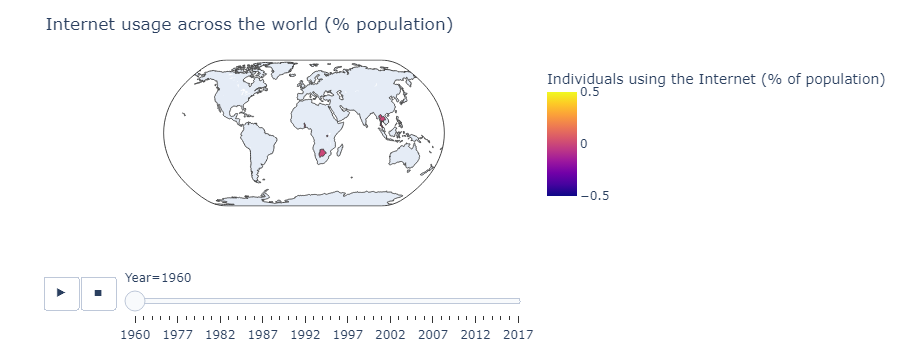

In [17]:
import plotly.express as px

fig = px.choropleth(internet_usage_df, 
                    locations="Code",
                    color="Individuals using the Internet (% of population)", # lifeExp is a column of gapminder
                    hover_name="Country", # column to add to hover information
                    animation_frame="Year", # column on which to animate
                    color_continuous_scale=px.colors.sequential.Plasma)
 
fig.update_layout(
    # add a title text for the plot
    title_text = 'Internet usage across the world (% population)',
    # set projection style for the plot
    geo = dict(projection={'type':'natural earth'}) # by default, projection type is set to 'equirectangular'
)
fig.show()

- Podemos ver que hubo definitivamente un aumento en el uso de Internet entre 1992 y 2010. Hay un punto más que debe ser abordado antes de cerrar nuestra discusión sobre mapas coropléticos mundiales.
- En su trabajo, es posible que se encuentre con conjuntos de datos que serían interesantes de visualizar en un mapa geográfico, pero que no tienen una columna que indique su **código ISO 3166-1**. En estos casos, puede descargar los códigos de los países desde el sitio web oficial de la ISO (ver [iban country-codes](https://www.iban.com/country-codes)).

- Podrá ver el conjunto de datos de códigos de países utilizando el siguiente código

In [18]:
import pandas as pd
country_codes_url = "https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/country_codes.tsv"
country_codes = pd.read_csv(country_codes_url, sep='\t')
country_codes.head()

,Country,Alpha-2 code,Alpha-3 code,Numeric
0,Afghanistan,AF,AFG,4
1,Albania,AL,ALB,8
2,Algeria,DZ,DZA,12
3,American Samoa,AS,ASM,16
4,Andorra,AD,AND,20


## Mapas de los estados de EE.UU

- Aunque el objetivo de muchas visualizaciones es comparar y contrastar características específicas entre países, a menudo también hay contextos en los que necesitamos analizar características entre regiones más pequeñas, como los estados dentro de un país.
- Para generar mapas coropléticos para los estados de EE.UU. utilizaremos los datos de población por estados que están disponibles en el sitio web del censo de EE.UU. (ver [www.census.gov](https://www.census.gov/newsroom/press-kits/2018/pop-estimates-national-state.html)).

## Creación de un mapa coroplético de Estados Unidos

- En este ejercicio, utilizaremos el conjunto de datos de población de los Estados Unidos. Vamos a modificar el conjunto de datos y lo utilizaremos para trazar un mapa coroplético de todo el estado. A continuación, cambiaremos el diseño de este mapa para mostrar la población de EE. UU. a través de los estados

- Importar el módulo de Python

In [19]:
import pandas as pd

- Leer el conjunto de datos de la URL

In [20]:
us_population_url = 'https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/us_state_population.tsv'
df = pd.read_csv(us_population_url, sep='\t')
df.head()

,State,Code,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,Alabama,AL,4785448,4798834,4815564,4830460,4842481,4853160,4864745,4875120,4887871
1,Alaska,AK,713906,722038,730399,737045,736307,737547,741504,739786,737438
2,Arizona,AZ,6407774,6473497,6556629,6634999,6733840,6833596,6945452,7048876,7171646
3,Arkansas,AR,2921978,2940407,2952109,2959549,2967726,2978407,2990410,3002997,3013825
4,California,CA,37320903,37641823,37960782,38280824,38625139,38953142,39209127,39399349,39557045


- Es bueno que este conjunto de datos también tenga los códigos estatales disponibles en la función Código. Sin embargo, los datos no están en el formato que querríamos: están en el formato ancho y necesitamos que sea largo
- Utilice la función `melt` para convertir los datos al formato deseado

In [21]:
df = pd.melt(df, id_vars=['State', 'Code'], var_name="Year", value_name="Population")
df.head()

,State,Code,Year,Population
0,Alabama,AL,2010,4785448
1,Alaska,AK,2010,713906
2,Arizona,AZ,2010,6407774
3,Arkansas,AR,2010,2921978
4,California,CA,2010,37320903


- Una vez que sepa cómo generar un mapa coroplético de los países del mundo, un mapa coroplético de los estados de EE. UU. es bastante sencillo. A diferencia del caso de generar un mapa coroplético mundial en el que utilizamos el módulo `plotly` express utilizaremos el módulo `graph_objects` para generar el mapa coroplético para los estados en los Estados Unidos
- Importar el módulo graph_objects

In [22]:
import plotly.graph_objects as go

- Inicialice la figura con la función `Figure` en `graph_objects`. Específicamente, el argumento de datos debe ser una instancia de la clase `Choropleth` con los siguientes parámetros
    - **locations**: Se establece en la columna del `DataFrame` que contiene los códigos de los nombres de los estados.
    - **z**: Se establece en la columna que contiene la característica numérica con la que el mapa debe ser codificado por colores
    - **locationmode**: Este se establece como Estados Unidos.
    - **colorscale**: Esto se establece en un esquema de colores, como **Blues | Reds | Greens**. Para más opciones, consulte la documentación oficial de `plotly` (ver [builtin-colorscales](https://plotly.com/python/builtin-colorscales/)).
    - **colorbar_title**: Esto se establece en el título de la barra de color de la derecha, indicando la correspondencia de los valores de color y característica.

In [23]:
# initialize the figure
fig = go.Figure(
    data=go.Choropleth(
        locations=df['Code'], # Code for US states
        z = df['Population'].astype(int), # Data to be color-coded
        locationmode = 'USA-states', # set of locations match entries in 'locations'
        colorscale = 'Blues',
        colorbar_title = "Population"
    )
)

- Realice cambios en el diseño con `update_layout()` establezca `title_text` y `geo_scope`

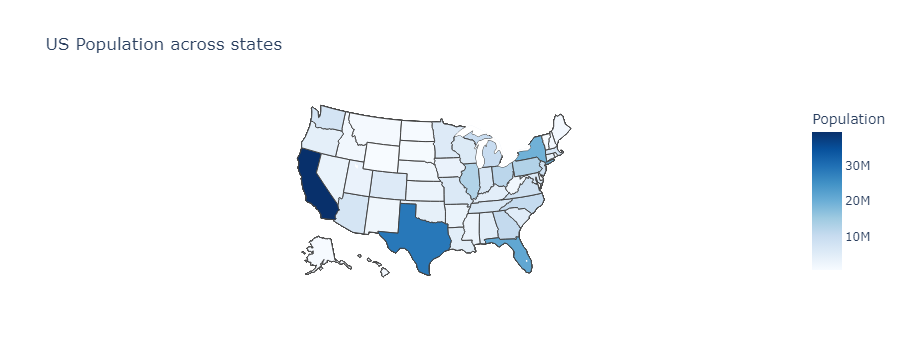

In [24]:
# update layout
fig.update_layout(
    title_text = 'US Population across states',
    geo_scope='usa', # limit map scope to USA
)
fig.show()

- Los mapas coropléticos son una forma eficaz de visualizar estadísticas agregadas en las divisiones de una región geográfica. Se pueden utilizar dos módulos de `plotly express` y `graph_objects` para generar mapas coropléticos interactivos. Los módulos mapean registros de divisiones, como países y estados, a ubicaciones en mapas geográficos utilizando un sistema de nombres de códigos estandarizados de países y estados

- En el siguiente ejemplo podemos visualizar como podemos realizar un gráfico que represente la ***cantidad de hectáreas por departamento, para el caso de Colombia***. Para sus proyectos de investigación es necesario que obtengan el archivo [Colombia.geo.json](https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/Colombia.geo.json) con la información que se requiere.

- `go.Choroplethmapbox` busca un campo `id` en el archivo `geojson` para la ***correspondencia entre ubicaciones y el archivo*** `geojson`, usualmente, el archivo `geojson` no tienen estas entradas `id`. Por este motivo deben ser añadidas como se indica a continuación. En resumen, la variable `'id'` es necesaria para ***garantizar que cada ubicación en el mapa coroplético se identifique correctamente y se mapee con sus datos correspondientes***.

In [25]:
import plotly.graph_objects as go
import json
from urllib.request import urlopen

In [26]:
with urlopen('https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/Colombia.geo.json') as response:
    counties = json.load(response)

In [27]:
locs=[]; z_id=[];
for loc in counties['features']:
    loc['id'] = loc['properties']['NOMBRE_DPT']
    locs.append(loc['properties']['NOMBRE_DPT'])
    z_id.append(loc['properties']['HECTARES'])

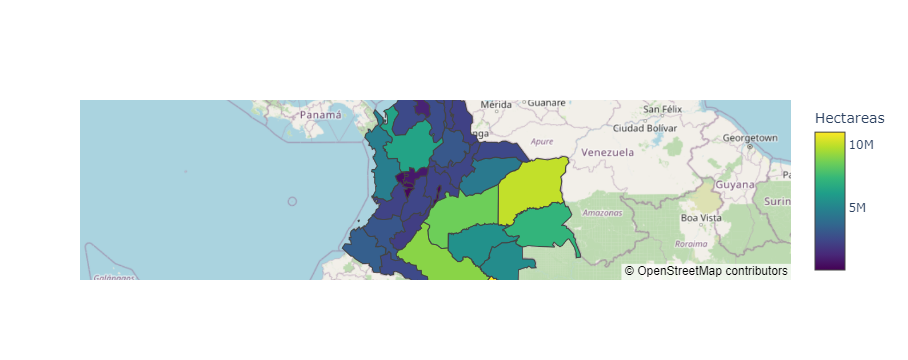

In [28]:
fig = go.Figure(go.Choroplethmapbox(
                    geojson=counties,
                    locations=locs,
                    z=z_id,
                    colorscale='Viridis',
                    colorbar_title="Hectareas"))

# fig.update_geos(showcountries=False, showcoastlines=False, showland=False, fitbounds="locations")
fig.update_layout(mapbox_style="open-street-map",
                  mapbox_zoom=3.78,
                  mapbox_center = {"lat": 4.570868, "lon": -74.2973328})
fig.show()

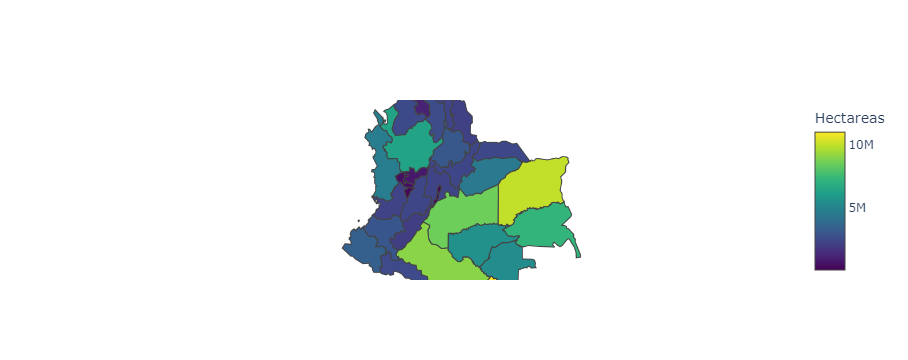

In [29]:
fig = go.Figure(go.Choroplethmapbox(
                    geojson=counties,
                    locations=locs,
                    z=z_id,
                    colorscale='Viridis',
                    colorbar_title="Hectareas"))
fig.update_layout(mapbox_style="white-bg",
                        mapbox_zoom=3.78,
                        mapbox_center = {"lat": 4.570868, "lon": -74.2973328})
fig.show()

## Gráficos sobre mapas geográficos

- Mientras que los gráficos anteriores eran excelentes para visualizar tendencias más globales como países o estados, ¿qué pasa si queremos representar características en regiones más pequeñas, digamos dentro de los estados individuales? En esta sección, aprenderá a dibujar gráficos de dispersión y gráficos de burbujas en los mapas.

## Creación de un gráfico de dispersión en un mapa geográfico

- Vamos a trazar las ubicaciones de las tiendas **Walmart** en un mapa de los Estados Unidos. Este conjunto de datos está disponible públicamente en: https://github.com/plotly/datasets/ sitio web de `plotly`. En este ejercicio, utilizaremos el conjunto de datos de aperturas de tiendas **Walmart** de 1962 a 2006. 
- Para crear un gráfico de dispersión a partir de este conjunto de datos, utilizaremos el módulo `graph_objects`. Encontraremos una ubicación de interés en el mapa y asignaremos longitudes y latitudes en ese mapa y averiguaremos el número de aperturas de tiendas **Walmart** para diferentes partes de los Estados Unidos.

- Importar módulos de Python

In [30]:
import pandas as pd

- Lee los datos de la URL

In [31]:
walmart_locations_url = "https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/1962_2006_walmart_store_openings.csv"
walmart_loc_df = pd.read_csv(walmart_locations_url)
walmart_loc_df.head()

,storenum,OPENDATE,date_super,conversion,st,county,STREETADDR,STRCITY,STRSTATE,ZIPCODE,type_store,LAT,LON,MONTH,DAY,YEAR
0,1,7/1/62,3/1/97,1.0,5,7,2110 WEST WALNUT,Rogers,AR,72756,Supercenter,36.342235,-94.07141,7,1,1962
1,2,8/1/64,3/1/96,1.0,5,9,1417 HWY 62/65 N,Harrison,AR,72601,Supercenter,36.236984,-93.09345,8,1,1964
2,4,8/1/65,3/1/02,1.0,5,7,2901 HWY 412 EAST,Siloam Springs,AR,72761,Supercenter,36.179905,-94.50208,8,1,1965
3,8,10/1/67,3/1/93,1.0,5,29,1621 NORTH BUSINESS 9,Morrilton,AR,72110,Supercenter,35.156491,-92.75858,10,1,1967
4,7,10/1/67,NaN,NaN,5,119,3801 CAMP ROBINSON RD.,North Little Rock,AR,72118,Wal-Mart,34.813269,-92.30229,10,1,1967


- Volveremos a utilizar el módulo `graph_objects` para generar nuestro gráfico de dispersión en el mapa de Estados Unidos. En cuanto al mapa de coropletas, utilizaremos la función `Figure` de `graph_objects` y la función `update_layout()`. Sin embargo, esta vez asignaremos una instancia de la clase `Scattergeo` como argumento de `Figure()`. Pasaremos las longitudes y latitudes de nuestras localizaciones de interés utilizando los parámetros `lon` y `lat`

- Trazar el gráfico de dispersión utilizando la función `update_layout`

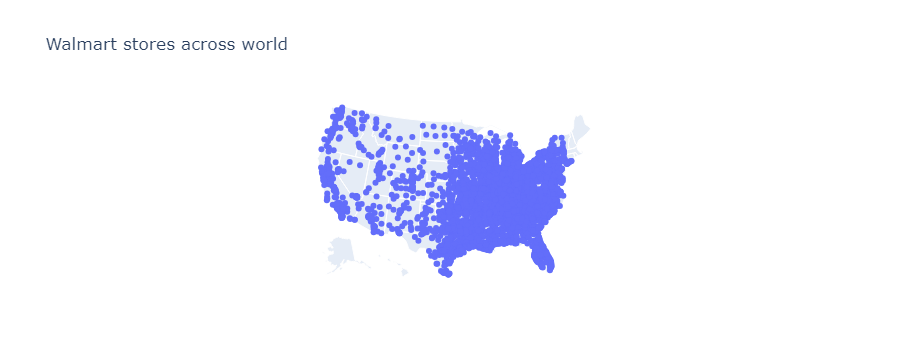

In [32]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Scattergeo(
    lon = walmart_loc_df['LON'], # column containing longitude information of the locations to plot
    lat = walmart_loc_df['LAT'], # column containing latitude information of the locations to plot
    text = walmart_loc_df['STREETADDR'], # column containing value to be displayed on hovering over the map
    mode = 'markers' # a marker for each location
))

fig.update_layout(
    title = 'Walmart stores across world',
    geo_scope='usa',
)
fig.show()

- Una observación sorprendente es que Walmart es mucho más prominente en el este de los EE.UU. que en el oeste

## Creación de un gráfico de burbujas en un mapa geográfico

- Dado que la parte oriental del mapa de EE. UU. parece estar muy densamente poblada de tiendas **Walmart**, podría ser una buena idea mostrar una característica agregada, como el recuento de tiendas **Walmart** en los diferentes estados. Los gráficos de burbujas están diseñados exactamente para este tipo de visualización.

- En el contexto actual de la visualización de datos geográficos, los gráficos de burbujas son gráficos con tantas burbujas como regiones de interés, en los que el tamaño de las burbujas depende del valor que indiquen, cuanto mayor sea el valor, mayor será la burbuja
  
- En este ejercicio, utilizaremos el conjunto de datos de aperturas de tiendas **Walmart** de 1962 a 2006 y generar un gráfico de burbujas para ver el número de tiendas **Walmart** en los diferentes estados de los Estados Unidos.

- A continuación, veremos otro contexto y generaremos un gráfico de burbujas utilizando el conjunto de datos `internet usage` para averiguar el número de usuarios de internet en todo el mundo. También animaremos el gráfico de burbujas para mostrar el aumento del número de usuarios de Internet en todo el mundo

- Importar módulos de Python

In [33]:
import pandas as pd

- Lee los datos de la URL

In [34]:
walmart_locations_url = "https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/1962_2006_walmart_store_openings.csv"
walmart_loc_df = pd.read_csv(walmart_locations_url)
walmart_loc_df.head()

,storenum,OPENDATE,date_super,conversion,st,county,STREETADDR,STRCITY,STRSTATE,ZIPCODE,type_store,LAT,LON,MONTH,DAY,YEAR
0,1,7/1/62,3/1/97,1.0,5,7,2110 WEST WALNUT,Rogers,AR,72756,Supercenter,36.342235,-94.07141,7,1,1962
1,2,8/1/64,3/1/96,1.0,5,9,1417 HWY 62/65 N,Harrison,AR,72601,Supercenter,36.236984,-93.09345,8,1,1964
2,4,8/1/65,3/1/02,1.0,5,7,2901 HWY 412 EAST,Siloam Springs,AR,72761,Supercenter,36.179905,-94.50208,8,1,1965
3,8,10/1/67,3/1/93,1.0,5,29,1621 NORTH BUSINESS 9,Morrilton,AR,72110,Supercenter,35.156491,-92.75858,10,1,1967
4,7,10/1/67,NaN,NaN,5,119,3801 CAMP ROBINSON RD.,North Little Rock,AR,72118,Wal-Mart,34.813269,-92.30229,10,1,1967


- Utilice la función `groupby` para calcular el número de tiendas Walmart por estado

In [35]:
walmart_stores_by_state = walmart_loc_df.groupby('STRSTATE').count()['storenum'].reset_index().rename(columns={'storenum':'NUM_STORES'})
walmart_stores_by_state.head()

,STRSTATE,NUM_STORES
0,AL,90
1,AR,81
2,AZ,55
3,CA,159
4,CO,56


- Para generar los gráficos de burbujas, utilizaremos el módulo `plotly express` y la función `scatter_geo`. Obsérvese que el parámetro `locations` se establece con el nombre de la columna que contiene los códigos de estado, y el parámetro `size` se ajusta a la función función `NUM_STORES`

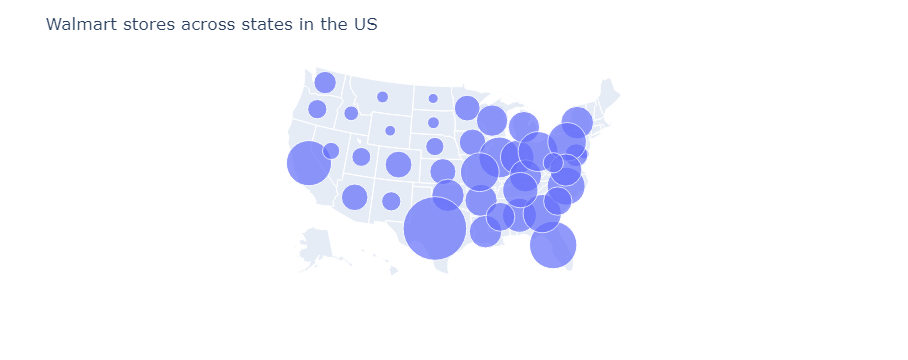

In [36]:
import plotly.express as px
fig = px.scatter_geo(walmart_stores_by_state,
                     locations="STRSTATE", # name of column which contains state codes
                     size="NUM_STORES", # name of column which contains aggregate value to visualize
                     locationmode = 'USA-states',
                     hover_name="STRSTATE",
                     size_max=45)

fig.update_layout(
    # add a title text for the plot
    title_text = 'Walmart stores across states in the US',
    # limit plot scope to USA
    geo_scope='usa'
)
fig.show()

- ¿Se te ocurre algún otro contexto en el que un gráfico de burbujas pueda ser útil para visualización? ¿Qué tal si revisamos los datos de uso de Internet (sobre los ***porcentajes de la población que utiliza Internet en cada país***) para generar un gráfico de burbujas a nivel mundial?
- Resulta que el recuento de individuos que utilizan Internet en cada país también está disponible en el mismo recurso (ver [Our World in Data](https://ourworldindata.org/internet)) que hemos utilizado para recoger nuestros datos anteriores.

- Utilice el siguiente código para leer los datos de los usuarios de Internet por país conjunto de datos

In [37]:
import pandas as pd

internet_users_url = "https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/number-of-internet-users-by-country.csv"
internet_users_df = pd.read_csv(internet_users_url)
internet_users_df.head()

,Country,Code,Year,Number of internet users (users)
0,Afghanistan,AFG,1990,0
1,Afghanistan,AFG,2001,990
2,Afghanistan,AFG,2002,1003
3,Afghanistan,AFG,2003,20272
4,Afghanistan,AFG,2004,25520


- Ordenar el DataFrame por la característica *Year*

In [38]:
internet_users_df.sort_values(by=['Year'],inplace=True)
internet_users_df.head()

,Country,Code,Year,Number of internet users (users)
0,Afghanistan,AFG,1990,0
1257,Eritrea,ERI,1990,0
1236,Equatorial Guinea,GNQ,1990,0
4016,Timor,TLS,1990,0
1214,El Salvador,SLV,1990,0


- Traza el número de usuarios que utilizan Internet en todo el mundo en 2016

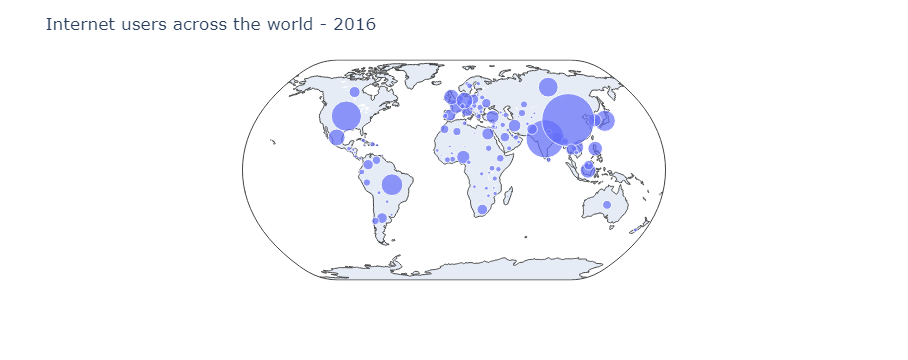

In [39]:
import plotly.express as px

fig = px.scatter_geo(internet_users_df.query("Year==2016"),
                     locations="Code", # name of column indicating country-codes
                     size="Number of internet users (users)", # name of column by which to size the bubble
                     hover_name="Country", # name of column to be displayed while hovering over the map
                     size_max=80, # parameter to scale all bubble sizes
                     color_continuous_scale=px.colors.sequential.Plasma)
 
fig.update_layout(
    # add a title text for the plot
    title_text = 'Internet users across the world - 2016', # set projection style for the plot
    geo = dict(projection={'type':'natural earth'}) # by default, projection type is set to 'equirectangular'
)
fig.show()

- ¿Notas que el mayor número de usuarios procede de India y China? Como sabemos por nuestro conjunto de datos anterior que el porcentaje de la población que utiliza Internet en estos países es bajo, este gran grupo de usuarios puede atribuirse a la población de estos países.
- Anima el gráfico de burbujas para mostrar el aumento del número de usuarios de Internet a lo largo de los años utilizando el parámetro `animation_frame`:

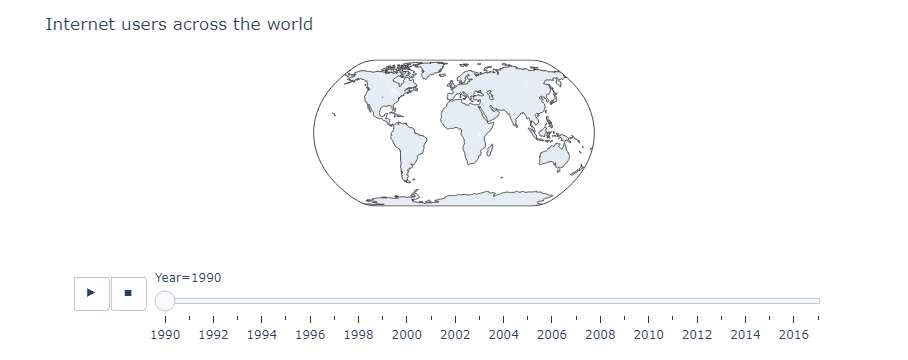

In [40]:
import plotly.express as px

fig = px.scatter_geo(internet_users_df,
                     locations="Code", # name of column indicating country-codes
                     size="Number of internet users (users)", # name of column by which to size the bubble
                     hover_name="Country", # name of column to be displayed while hovering over the map
                     size_max=80, # parameter to scale all bubble size
                     animation_frame="Year"
                    )
 
fig.update_layout(
    # add a title text for the plot
    title_text = 'Internet users across the world', # set projection style for the plot
    geo = dict(projection={'type':'natural earth'}) # by default, projection type is set to 'equirectangular'
)
fig.show()

- Podemos ver en los dos gráficos anteriores cómo el número de usuarios de Internet aumentó entre 2001 y 2016 en Estados Unidos. Los gráficos de dispersión en los mapas pueden utilizarse para mostrar ubicaciones específicas de interés en los mapas geográficos, mientras que los mapas de burbujas son una buena forma de presentar los datos de recuento a través de diferentes fuentes.

## Líneas sobre mapas geográficos

- Los gráficos de líneas representados en mapas son otra clase importante de visualización de datos geográficos. Para esta sección, utilizaremos los datos de aeropuertos y vuelos del conjunto de datos de retrasos y cancelaciones de vuelos de 2015 publicado por el **U.S. Department of Transportation's (DOT). Bureau of Transportation Statistics**
- Como el conjunto de datos es enorme, solo incluiremos los datos de todos los vuelos con retrasos de las aerolíneas el 1 de enero de 2015.
- **airports.csv**: Contiene atributos de ubicación como la información de latitud y longitud para todos los aeropuertos
- **new_year_day_2015_delayed_flights.csv**: Contiene detalles de los vuelos, como los números de vuelo, aeropuertos de origen y destino de todos los vuelos del subconjunto seleccionado.

## Creación de gráficos de líneas en un mapa geográfico

- En este ejercicio, utilizaremos el conjunto de datos de los aeropuertos y generaremos primero un gráfico de dispersión para averiguar la `ubicación de todos los aeropuertos de Estados Unidos`. A continuación, combinaremos los dos `DataFrames` (**flights** y **airport_record**) para obtener la longitud y latitud de los de los aeropuertos de origen de todos los vuelos y dibujaremos líneas desde el aeropuerto de origen hasta el aeropuerto de destino de cada vuelo utilizando esta fusión.

- Cargue primero el conjunto de datos de los aeropuertos. Nótese que `IATA_CODE` corresponde al código del aeropuerto, posteriormente utilizado para la operación `merge` (ver [Código de aeropuertos de IATA](https://es.wikipedia.org/wiki/C%C3%B3digo_de_aeropuertos_de_IATA))

In [41]:
import pandas as pd
us_airports_url = "https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/airports.csv"
us_airports_df = pd.read_csv(us_airports_url)
us_airports_df.head()

,IATA_CODE,AIRPORT,CITY,STATE,COUNTRY,LATITUDE,LONGITUDE
0,ABE,Lehigh Valley International Airport,Allentown,PA,USA,40.65236,-75.44040
1,ABI,Abilene Regional Airport,Abilene,TX,USA,32.41132,-99.68190
2,ABQ,Albuquerque International Sunport,Albuquerque,NM,USA,35.04022,-106.60919
3,ABR,Aberdeen Regional Airport,Aberdeen,SD,USA,45.44906,-98.42183
4,ABY,Southwest Georgia Regional Airport,Albany,GA,USA,31.53552,-84.19447


- Generar un gráfico de dispersión en el mapa de Estados Unidos para indicar la ubicación de todos los aeropuertos en nuestro conjunto de datos, utilizando el módulo `graph_objects`. 

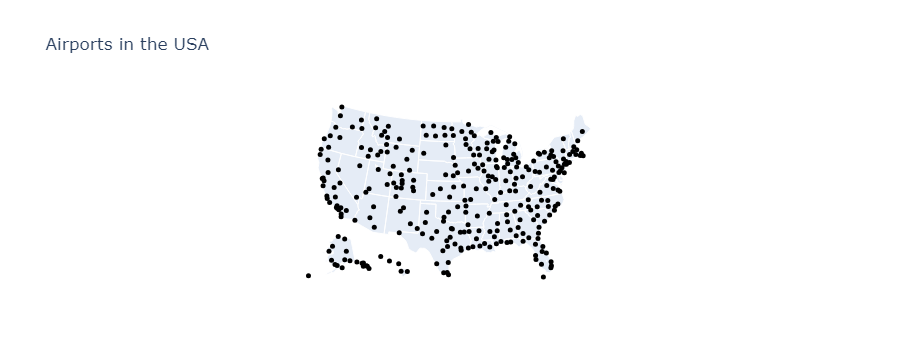

In [42]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scattergeo(locationmode = 'USA-states',
                            lon = us_airports_df['LONGITUDE'],
                            lat = us_airports_df['LATITUDE'],
                            hoverinfo = 'text',
                            text = us_airports_df['AIRPORT'],
                            mode = 'markers',
                            marker = dict(size = 5,color = 'black')))
fig.update_layout(
    title_text = 'Airports in the USA',
    showlegend = False,
    geo = go.layout.Geo(scope = 'usa')
)
fig.show()

- Al pasar el ratón por encima de un punto de datos, aparecerá el nombre del aeropuerto estadounidense. ¿Se ha dado cuenta de que hay una función `add_trace()` además de la habitual creación de instancias de la clase `Scattergeo`? La función `add_trace` se utiliza porque ***vamos a superponer nuestros datos de vuelos en forma de líneas sobre este gráfico de dispersión en el mapa***. La función `add_trace` permite a `plotly` tratar el gráfico de dispersión y los trazados de líneas como múltiples capas en el mapa.

- Cargar el archivo que contiene los registros de vuelos

In [43]:
new_year_2015_flights_url = "https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/new_year_day_2015_delayed_flights.csv"
new_year_2015_flights_df = pd.read_csv(new_year_2015_flights_url)
new_year_2015_flights_df.head()

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015,1,1,4,HA,17,N389HA,LAS,HNL,145,...,610.0,15.0,0,0,NaN,0.0,0.0,15.0,0.0,0.0
1,2015,1,1,4,B6,2134,N307JB,SJU,MCO,400,...,730.0,85.0,0,0,NaN,0.0,0.0,85.0,0.0,0.0
2,2015,1,1,4,B6,2276,N646JB,SJU,BDL,438,...,908.0,89.0,0,0,NaN,17.0,0.0,72.0,0.0,0.0
3,2015,1,1,4,US,425,N174US,PDX,PHX,520,...,950.0,60.0,0,0,NaN,0.0,0.0,60.0,0.0,0.0
4,2015,1,1,4,AA,89,N3KVAA,IAH,MIA,520,...,935.0,54.0,0,0,NaN,0.0,0.0,54.0,0.0,0.0


- Junto con los aeropuertos de origen y destino de cada vuelo, necesitamos tener la información de longitud y latitud de los aeropuertos correspondientes. Para ello necesitamos fusionar los `DataFrames` que contienen los ***datos del aeropuerto y del vuelo. Primero fusionamos los dos conjuntos de datos para obtener las longitudes y latitudes de todos los vuelos*** (ver [Joins en Pandas](https://lihkir.github.io/DataVizPythonRUninorte/interactive_dataviz.html#preparacion-de-nuestro-conjunto-de-datos))

In [44]:
# merge the DataFrames on origin airport codes
new_year_2015_flights_df = new_year_2015_flights_df.merge(us_airports_df[['IATA_CODE','LATITUDE','LONGITUDE']], \
                                                          left_on='ORIGIN_AIRPORT', \
                                                          right_on='IATA_CODE', \
                                                          how='inner')

# drop the duplicate column containing airport code
new_year_2015_flights_df.drop(columns=['IATA_CODE'],inplace=True)

# rename the latitude and longitude columns to reflect that they correspond to the origin airport
new_year_2015_flights_df.rename(columns={"LATITUDE":"ORIGIN_AIRPORT_LATITUDE", "LONGITUDE":"ORIGIN_AIRPORT_LONGITUDE"},inplace=True)
new_year_2015_flights_df.head()

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,...,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,ORIGIN_AIRPORT_LATITUDE,ORIGIN_AIRPORT_LONGITUDE
0,2015,1,1,4,HA,17,N389HA,LAS,HNL,145,...,0,0,NaN,0.0,0.0,15.0,0.0,0.0,36.08036,-115.15233
1,2015,1,1,4,HA,7,N395HA,LAS,HNL,900,...,0,0,NaN,0.0,0.0,23.0,0.0,0.0,36.08036,-115.15233
2,2015,1,1,4,AA,1623,N438AA,LAS,DFW,905,...,0,0,NaN,4.0,0.0,133.0,0.0,0.0,36.08036,-115.15233
3,2015,1,1,4,DL,1530,N954DN,LAS,MSP,920,...,0,0,NaN,1.0,0.0,15.0,0.0,0.0,36.08036,-115.15233
4,2015,1,1,4,WN,1170,N902WN,LAS,ELP,950,...,0,0,NaN,5.0,0.0,11.0,0.0,0.0,36.08036,-115.15233


- Ahora, realizaremos una ***fusión similar para obtener los datos de latitud y longitud de los aeropuertos de destino*** de todos los vuelos

In [45]:
# merge the DataFrames on destination airport codes
new_year_2015_flights_df = new_year_2015_flights_df.merge(us_airports_df[['IATA_CODE','LATITUDE','LONGITUDE']], \
                                                          left_on='DESTINATION_AIRPORT', \
                                                          right_on='IATA_CODE', \
                                                          how='inner')

# drop the duplicate column containing airport code
new_year_2015_flights_df.drop(columns=['IATA_CODE'],inplace=True)

# rename the latitude and longitude columns to reflect that they correspond to the destination airport
new_year_2015_flights_df.rename(columns={'LATITUDE':'DESTINATION_AIRPORT_LATITUDE', 'LONGITUDE':'DESTINATION_AIRPORT_LONGITUDE'},inplace=True)
new_year_2015_flights_df.head()

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,...,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,ORIGIN_AIRPORT_LATITUDE,ORIGIN_AIRPORT_LONGITUDE,DESTINATION_AIRPORT_LATITUDE,DESTINATION_AIRPORT_LONGITUDE
0,2015,1,1,4,HA,17,N389HA,LAS,HNL,145,...,NaN,0.0,0.0,15.0,0.0,0.0,36.08036,-115.15233,21.31869,-157.92241
1,2015,1,1,4,HA,7,N395HA,LAS,HNL,900,...,NaN,0.0,0.0,23.0,0.0,0.0,36.08036,-115.15233,21.31869,-157.92241
2,2015,1,1,4,UA,253,N768UA,IAH,HNL,920,...,NaN,8.0,0.0,42.0,0.0,0.0,29.98047,-95.33972,21.31869,-157.92241
3,2015,1,1,4,UA,328,N210UA,DEN,HNL,1130,...,NaN,0.0,0.0,31.0,0.0,0.0,39.85841,-104.66700,21.31869,-157.92241
4,2015,1,1,4,UA,1173,N56859,SFO,HNL,805,...,NaN,0.0,0.0,17.0,0.0,0.0,37.61900,-122.37484,21.31869,-157.92241


- Ahora, dibujaremos nuestros gráficos de líneas. Para cada vuelo, tenemos que ***dibujar una línea entre el aeropuerto de origen y el de destino***. Esto se hace proporcionando los valores de latitud y longitud de los aeropuertos de destino y origen a los parámetros `lon` y `lat` de `Scattergeo` y ajustando el modo a líneas en lugar de marcadores. Además, fíjate en que aquí estamos utilizando otra función `add_trace` 

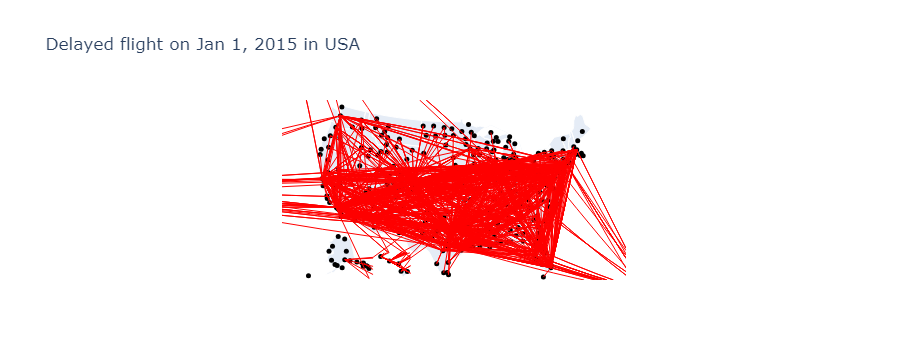

In [46]:
for i in range(len(new_year_2015_flights_df)):
    fig.add_trace(
        go.Scattergeo(
            locationmode = 'USA-states',
            lon = [new_year_2015_flights_df['ORIGIN_AIRPORT_LONGITUDE'][i], new_year_2015_flights_df['DESTINATION_AIRPORT_LONGITUDE'][i]],
            lat = [new_year_2015_flights_df['ORIGIN_AIRPORT_LATITUDE'][i], new_year_2015_flights_df['DESTINATION_AIRPORT_LATITUDE'][i]],
            mode = 'lines',
            line = dict(width = 1,color = 'red')
        )
    )
    
fig.update_layout(
    title_text = 'Delayed flight on Jan 1, 2015 in USA',
    showlegend = False,
    geo = go.layout.Geo(
        scope = 'usa'
    ),
)
fig.show()

- Los trazados de líneas en los mapas geográficos pueden ser generados usando el módulo `graph_objects` de `plotly`.

````{admonition} Resumen
- En este capítulo hemos presentado tres tipos diferentes de ***visualización de datos geográficos, gráficos de dispersión y de burbujas sobre mapas geográficos y gráficos de líneas sobre mapas geográficos***. Los mapas coropléticos presentan estadísticas agregadas a través de diferentes regiones de los mapas geográficos.
- Los gráficos de dispersión son eficaces para indicar detalles sobre lugares específicos de interés, mientras que los gráficos de burbujas son útiles para presentar datos de recuento por región en un mapa. Los gráficos de líneas son útiles para visualizar las rutas de los sistemas de transporte, por ejemplo.
- Estos gráficos pueden generarse fácilmente con los módulos `plotly express` y `graph_objects`. La animación puede realizarse con respecto a una característica numérica discreta en un conjunto de datos.
````

## Ejercicio para entregar

- Trabajaremos con los conjuntos de datos **Renewable Energy Consumption and Production** de Our World in Data https://ourworldindata.org/renewable-energy). Estos conjuntos de datos están disponibles en el repositorio **GitHub** del curso, púedes ser importados con las **URL**: [share-of-electricity-production-from-renewable-sources.csv](https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/share-of-electricity-production-from-renewable-sources.csv), [renewable-energy-consumption-by-country.csv](https://raw.githubusercontent.com/lihkir/Uninorte/main/AppliedStatisticMS/DataVisualizationRPython/Lectures/Python/PythonDataSets/renewable-energy-consumption-by-country.csv)
- Su tarea consiste en crear mapas coropléticos de la producción y el consumo totales de energía renovable y el consumo en diferentes países del mundo animados en base a los años de años de producción/consumo entre (excluyendo) 2007 y 2017.

- **Pasos principales**
    1. Cargar el conjunto de datos de producción de energía renovable.
    2. Ordenar el `DataFrame` de producción en función de la característica *Year*.
    3. Generar un mapa de coropletas para la producción de energía renovable utilizando el módulo `plotly express` animado en función del *Year*.
    4. Actualice el diseño para incluir un estilo de proyección adecuado y un texto de título, y luego muestre la figura.
    5. Cargue el conjunto de datos de consumo de energía renovable.
    6. Convierta el `DataFrame` de consumo a un formato adecuado para su visualización.
    7. Ordenar el `DataFrame` de consumo en base a la característica *Year*.
    8. Generar un mapa coroplético para el consumo de energía renovable utilizando el módulo `plotly express` animado en función del año.
    9. Actualice el diseño para incluir un estilo de proyección adecuado y un texto de título, y luego muestre la figura.